In [1]:
import matplotlib.pyplot as plt
import pandas as pd

from spice_net import SpiceNet
from spice_net import SpiceNetHcm
from spice_net import SpiceNetSom
from spice_net.learning_rate_functions import ExpEDecayLRF, LinearLRF, ConstLRF
from spice_net.plotting import *

In [2]:
som_neuron_count = 30
df = pd.read_csv('data/test_data.csv')
df

,init,result
0,-0.868245,-0.654525
1,0.866917,0.651528
2,-0.102037,-0.001062
3,0.602888,0.219135
4,0.838314,0.589141
...,...,...
2995,-0.181318,-0.005961
2996,0.314093,0.030987
2997,-0.313361,-0.030771
2998,0.144365,0.003009


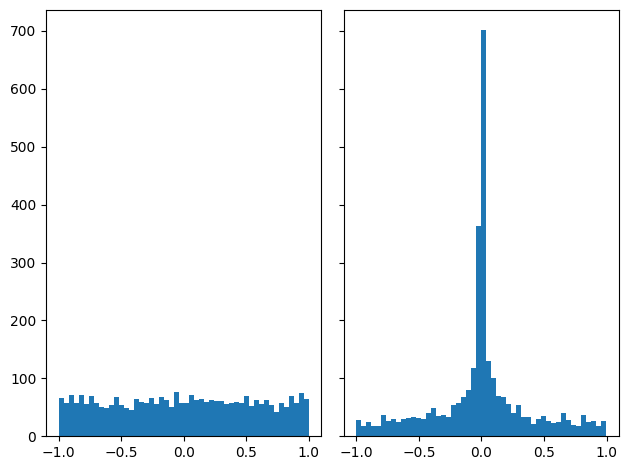

In [3]:
n_bins = 50

_, axs = plt.subplots(1, 2, sharey=True, tight_layout=True)

# We can set the number of bins with the *bins* keyword argument.
axs[0].hist(df['init'], bins=n_bins)
axs[1].hist(df['result'], bins=n_bins)

plt.show()

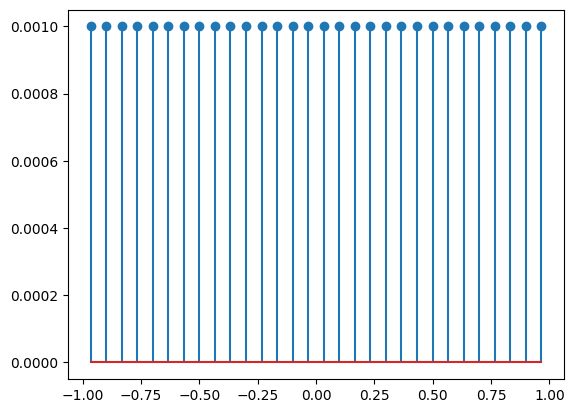

In [4]:
# tuning_curve_lrf = ExpEDecayLRF(0.001, 0.0)
tuning_curve_lrf = LinearLRF(-0.000001, 0.07)
#interaction_kernel_lrf = ExpEDecayLRF(0.001, 0.0, 1.5)
interaction_kernel_lrf = LinearLRF(1 / (len(df) * 2), 0.5)

som_result = SpiceNetSom(som_neuron_count,
                         df['init'].min(),
                         df['init'].max(),
                         tuning_curve_lrf,
                         interaction_kernel_lrf)
plot_som_weights_stem(som_result)

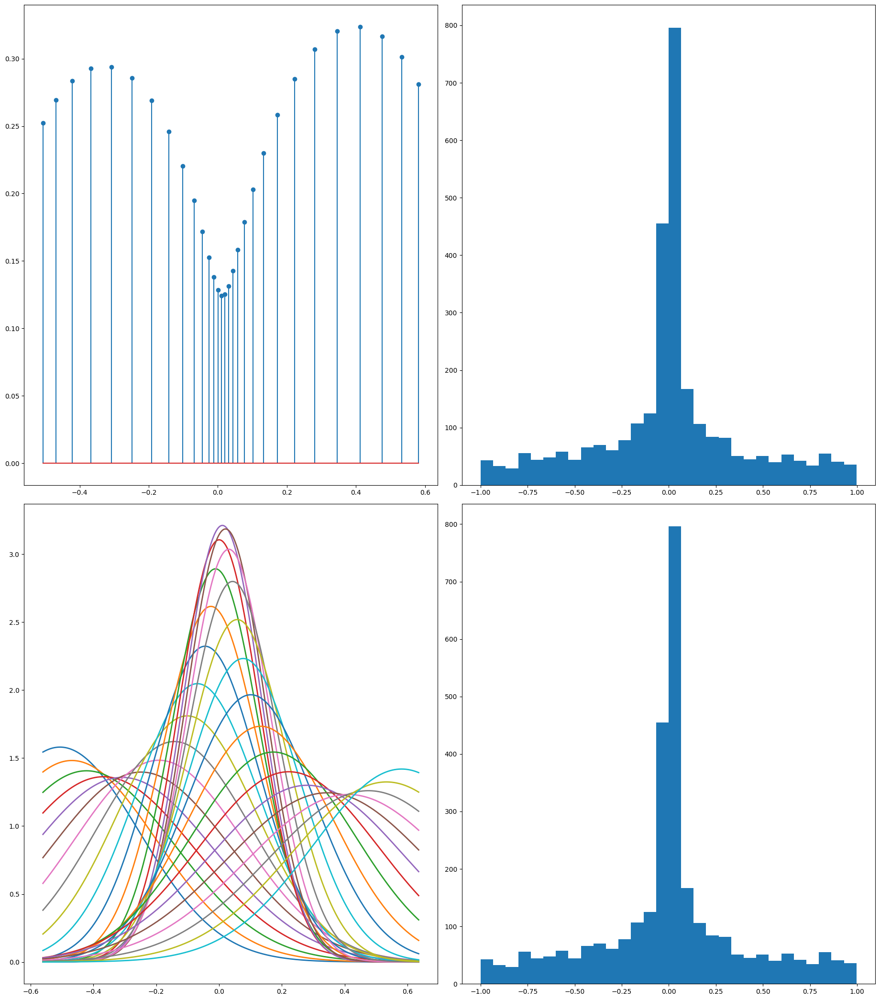

In [5]:
som_result.fit(df['result'], 10)
plot_som_comparison_to_data(som_result, df['result'].tolist())

In [6]:
plot_som(som_result)

In [7]:
som_init = SpiceNetSom(som_neuron_count,
                       df['init'].min(),
                       df['init'].max(),
                       tuning_curve_lrf,
                       interaction_kernel_lrf)
som_init.fit(df['init'].tolist(), 10)
plot_som(som_init)

In [8]:
lrf_weights = ConstLRF(0.0003)
lrf_trust_of_new = ConstLRF(0.0003)
hebbian_correlation_matrix = SpiceNetHcm(som_result,
                                         som_init,
                                         lrf_weights=lrf_weights,
                                         lrf_trust_of_new=lrf_trust_of_new)
# TODO: Why the hell did this work at all?
hebbian_correlation_matrix.fit(df['result'].tolist(),
                               df['init'].tolist(),
                               10)

plot_hcm(hebbian_correlation_matrix)

In [9]:
#tuning_curve_lrf = LinearLRF(slope=(len(df) / 2 - 1) / len(df), bias=len(df) / 2)
#interaction_kernel_lrf = ConstLRF(0.0003)

test_som_1 = SpiceNetSom(n_neurons=30,
                         value_range_start=df['init'].min(),
                         value_range_end=df['init'].max(),
                         lrf_tuning_curve=tuning_curve_lrf,
                         lrf_interaction_kernel=interaction_kernel_lrf)
test_som_2 = SpiceNetSom(n_neurons=30,
                         value_range_start=df['result'].min(),
                         value_range_end=df['result'].max(),
                         lrf_tuning_curve=tuning_curve_lrf,
                         lrf_interaction_kernel=interaction_kernel_lrf)

lrf_weights = ExpEDecayLRF(0.0001, 0.0001)
lrf_trust_of_new = ExpEDecayLRF(0.0001, 0.0001)
#lrf_weights = ConstLRF(0.0003)
#lrf_trust_of_new = ConstLRF(0.0003)

correlation_matrix = SpiceNetHcm(test_som_1,
                                 test_som_2,
                                 lrf_weights=lrf_weights,
                                 lrf_trust_of_new=lrf_trust_of_new)

spice_net = SpiceNet(correlation_matrix)
spice_net.fit(values_som_1=df['init'].tolist(),
              values_som_2=df['result'].tolist(),
              epochs_on_batch=10,
              batch_size=None,
              print_output=True)


100%|██████████| 1/1 [00:07<00:00,  7.45s/it]

Time spend on the Components: 
Som: 4.710871458053589 s | Convolution Matrix: 2.740413188934326 s


In [10]:
plot_hcm(spice_net.get_correlation_matrix())

plot_som(spice_net.get_som_1(), True)
plot_som(spice_net.get_som_2(), True)

In [11]:
sample = df.sample(1)
print(f'Predicted: {spice_net.decode(float(sample.iloc[0]['init']))} Actual: {float(sample.iloc[0]['result'])}')

Predicted: -0.9659969689372885 Actual: -0.1557569482118918
